<a href="https://colab.research.google.com/github/OlegBEZb/assesment_preparation/blob/main/Wine%20quality%20dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%capture

!pip install scipy -U
!pip install auto-sklearn
!pip install kaggle
!pip install pandas-profiling -U

In [2]:
import sklearn
import pandas as pd
pd.set_option('display.max_colwidth', None)

In [3]:
df = pd.read_csv('WineQT.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,2
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,3
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,4


In [4]:
df.drop(['Id'], axis=1, inplace=True)

In [5]:
target_col = 'quality'

# EDA

In [6]:
from pandas_profiling import ProfileReport

In [7]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Preprocessing

In [8]:
y = df[target_col]
X = df.drop([target_col], axis=1)

In [9]:
y.value_counts()

5    483
6    462
7    143
4     33
8     16
3      6
Name: quality, dtype: int64

In [10]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Modeling

In [11]:
minutes_limit = 4

## auto-sklearn

In [ ]:
import autosklearn.classification
import sklearn
from autosklearn.metrics import balanced_accuracy, precision, recall, f1_macro, accuracy

automl = autosklearn.classification.AutoSklearnClassifier(
    time_left_for_this_task=60*minutes_limit,
    per_run_time_limit=30,
    ensemble_size=1,
    # tmp_folder='/tmp/autosklearn_resampling_example_tmp',
    disable_evaluator_output=False,
    resampling_strategy=sklearn.model_selection.StratifiedKFold(),
    resampling_strategy_arguments={'n_splits': 5},
    metric=f1_macro,
    scoring_functions=[balanced_accuracy, accuracy, precision, recall],
    include={
        'classifier': [
            'decision_tree',# 'lda', 'sgd'
        ],
        'feature_preprocessor': [
            'no_preprocessing', #'polynomial', 'select_percentile_classification'
        ]
    },
)
automl.fit(X_train, y_train)

AutoSklearnClassifier(ensemble_size=1,
                      include={'classifier': ['decision_tree'],
                               'feature_preprocessor': ['no_preprocessing']},
                      metric=f1_macro, per_run_time_limit=30,
                      resampling_strategy=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                      resampling_strategy_arguments={'n_splits': 5},
                      scoring_functions=[balanced_accuracy, accuracy, precision,
                                         recall],
                      time_left_for_this_task=60)

In [ ]:
print(automl.sprint_statistics())

auto-sklearn results:
  Dataset name: af8f0c4a-9a6c-11ec-8118-0242ac1c0002
  Metric: f1_macro
  Best validation score: 0.301217
  Number of target algorithm runs: 18
  Number of successful target algorithm runs: 17
  Number of crashed target algorithm runs: 0
  Number of target algorithms that exceeded the time limit: 1
  Number of target algorithms that exceeded the memory limit: 0



In [ ]:
automl.leaderboard(detailed = True, ensemble_only=False).head()

,rank,ensemble_weight,type,cost,duration,config_id,train_loss,seed,start_time,end_time,budget,status,data_preprocessors,feature_preprocessors,balancing_strategy,config_origin
model_id,,,,,,,,,,,,,,,,
5,1,1.0,decision_tree,0.698783,1.810647,4,0.438934,0,1.646255e+09,1.646255e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],none,Random Search (sorted)
15,2,0.0,decision_tree,0.709067,2.627015,14,0.464823,0,1.646255e+09,1.646255e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],weighting,Random Search
12,3,0.0,decision_tree,0.725320,1.794608,11,0.659602,0,1.646255e+09,1.646255e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],none,Random Search (sorted)
10,4,0.0,decision_tree,0.739443,2.019640,9,0.602372,0,1.646255e+09,1.646255e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],none,Random Search (sorted)
18,5,0.0,decision_tree,0.740044,2.015288,17,0.602372,0,1.646255e+09,1.646255e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],none,Random Search (sorted)


In [ ]:
df_cv_results = pd.DataFrame(automl.cv_results_).sort_values(by = 'mean_test_score', ascending = False)
df_cv_results[[c for c in df_cv_results.columns if not c.startswith('param_')]].head()

,mean_test_score,metric_balanced_accuracy,metric_accuracy,metric_precision,metric_recall,mean_fit_time,params,rank_test_scores,status,budgets
3,0.301217,0.300603,0.563457,NaN,NaN,1.810647,"{'balancing:strategy': 'none', 'classifier:__choice__': 'decision_tree', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'no_preprocessing', 'classifier:decision_tree:criterion': 'entropy', 'classifier:decision_tree:max_depth_factor': 1.5836944563156254, 'classifier:decision_tree:max_features': 1.0, 'classifier:decision_tree:max_leaf_nodes': 'None', 'classifier:decision_tree:min_impurity_decrease': 0.0, 'classifier:decision_tree:min_samples_leaf': 2, 'classifier:decision_tree:min_samples_split': 12, 'classifier:decision_tree:min_weight_fraction_leaf': 0.0, 'data_preprocessor:feature_type:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:__choice__': 'no_coalescense', 'data_preprocessor:feature_type:numerical_transformer:imputation:strategy': 'median', 'data_preprocessor:feature_type:numerical_transformer:rescaling:__choice__': 'minmax'}",1,Success,0.0
13,0.290933,0.349848,0.473742,NaN,NaN,2.627015,"{'balancing:strategy': 'weighting', 'classifier:__choice__': 'decision_tree', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'no_preprocessing', 'classifier:decision_tree:criterion': 'gini', 'classifier:decision_tree:max_depth_factor': 1.75600541653305, 'classifier:decision_tree:max_features': 1.0, 'classifier:decision_tree:max_leaf_nodes': 'None', 'classifier:decision_tree:min_impurity_decrease': 0.0, 'classifier:decision_tree:min_samples_leaf': 7, 'classifier:decision_tree:min_samples_split': 18, 'classifier:decision_tree:min_weight_fraction_leaf': 0.0, 'data_preprocessor:feature_type:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:__choice__': 'no_coalescense', 'data_preprocessor:feature_type:numerical_transformer:imputation:strategy': 'most_frequent', 'data_preprocessor:feature_type:numerical_transformer:rescaling:__choice__': 'standardize'}",2,Success,0.0
10,0.274680,0.276270,0.584245,NaN,NaN,1.794608,"{'balancing:strategy': 'none', 'classifier:__choice__': 'decision_tree', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'no_preprocessing', 'classifier:decision_tree:criterion': 'gini', 'classifier:decision_tree:max_depth_factor': 1.1421148328677273, 'classifier:decision_tree:max_features': 1.0, 'classifier:decision_tree:max_leaf_nodes': 'None', 'classifier:decision_tree:min_impurity_decrease': 0.0, 'classifier:decision_tree:min_samples_leaf': 17, 'classifier:decision_tree:min_samples_split': 9, 'classifier:decision_tree:min_weight_fraction_leaf': 0.0, 'data_preprocessor:feature_type:categorical_transformer:categorical_encoding:__choice__': 'no_encoding', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:__choice__': 'minority_coalescer', 'data_preprocessor:feature_type:numerical_transformer:imputation:strategy': 'most_frequent', 'data_preprocessor:feature_type:numerical_transformer:rescaling:__choice__': 'minmax', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': 0.023654226219422092}",3,Success,0.0
8,0.260557,0.266876,0.545952,NaN,NaN,2.019640,"{'balancing:strategy': 'none', 'classifier:__choice__': 'decision_tree', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'no_preprocessing', 'classifier:decision_tree:criterion': 'entropy', 'classifier:decision_tree:max_depth_factor': 1.899904518468103, 'classifier:decision_tree:max_features': 1.0, 'classifier:decision_tree:max_leaf_nodes': 'None', 'classifier:decision_tree:min_impurity_decrease': 0.0, 'classifier:decision_tree:min_samples_leaf': 13, 'classifier:de

In [ ]:
import sklearn

# One can use models trained during cross-validation directly to predict
# for unseen data. For this, all k models trained during k-fold
# cross-validation are considered as a single soft-voting ensemble inside
# the ensemble constructed with ensemble selection.
print('Before re-fit')
predictions = automl.predict(X_test)
print("Accuracy score CV", sklearn.metrics.accuracy_score(y_test, predictions))

Before re-fit


NotImplementedError: ignored

In [ ]:
# During fit(), models are fit on individual cross-validation folds. To use all 
# available data, we call refit() which trains all models in the final 
# ensemble on the whole dataset.
print('After re-fit')
automl.refit(X_train.copy(), y_train.copy())
predictions = automl.predict(X_test)
print("Accuracy score refit", sklearn.metrics.accuracy_score(y_test, predictions))

After re-fit
Accuracy score refit 0.5414847161572053


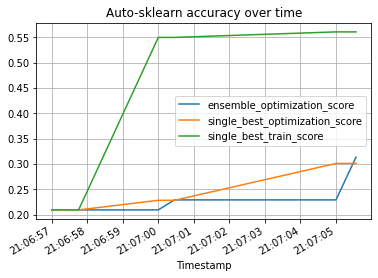

In [ ]:
import matplotlib.pyplot as plt

automl.performance_over_time_.plot(
        x='Timestamp',
        kind='line',
        legend=True,
        title='Auto-sklearn accuracy over time',
        grid=True,
    )
plt.show()

In [ ]:
import pprint

pp = pprint.PrettyPrinter(4)

In [ ]:
pp.pprint(automl.show_models())

{   5: {   'balancing': Balancing(random_state=1),
           'classifier': <autosklearn.pipeline.components.classification.ClassifierChoice object at 0x7fafbc826c10>,
           'cost': 0.698783236377004,
           'data_preprocessor': <autosklearn.pipeline.components.data_preprocessing.DataPreprocessorChoice object at 0x7fafbc836c50>,
           'ensemble_weight': 1.0,
           'feature_preprocessor': <autosklearn.pipeline.components.feature_preprocessing.FeaturePreprocessorChoice object at 0x7fafbc826e50>,
           'model_id': 5,
           'rank': 1,
           'sklearn_classifier': DecisionTreeClassifier(criterion='entropy', max_depth=12, min_samples_leaf=2,
                       min_samples_split=12, random_state=1)}}


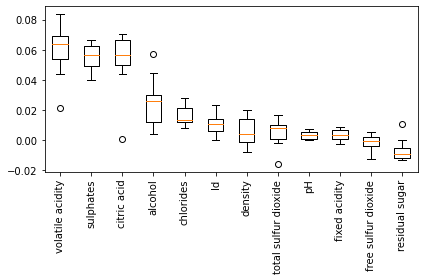

residual sugar: -0.007 +/- 0.007
free sulfur dioxide: -0.001 +/- 0.005
fixed acidity: 0.004 +/- 0.004
pH        : 0.004 +/- 0.003
total sulfur dioxide: 0.006 +/- 0.009
density   : 0.006 +/- 0.009
Id        : 0.011 +/- 0.007
chlorides : 0.016 +/- 0.006
alcohol   : 0.025 +/- 0.016
citric acid: 0.052 +/- 0.019
sulphates : 0.055 +/- 0.009
volatile acidity: 0.060 +/- 0.016


In [ ]:
from sklearn.inspection import plot_partial_dependence, permutation_importance

r = permutation_importance(automl, X_test, y_test, n_repeats=10, random_state=0)
sort_idx = r.importances_mean.argsort()[::-1]

plt.boxplot(r.importances[sort_idx].T,
            labels=[X_test.columns[i] for i in sort_idx])

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

for i in sort_idx[::-1]:
    print(f"{X_test.columns[i]:10s}: {r.importances_mean[i]:.3f} +/- "
          f"{r.importances_std[i]:.3f}")

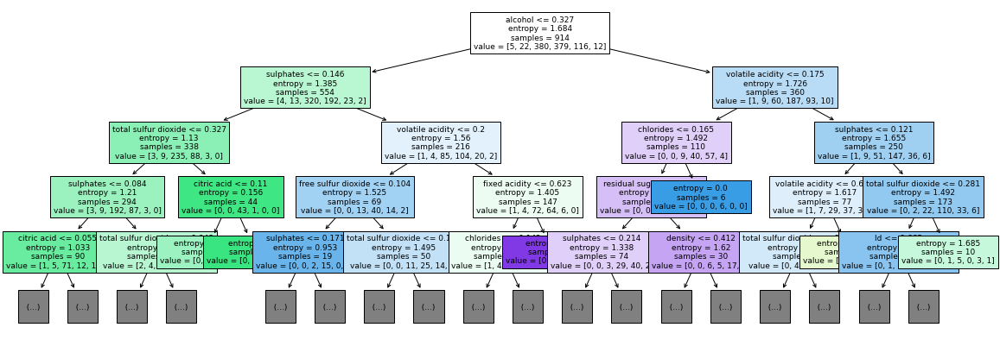

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from matplotlib import pyplot as plt

fig, axes = plt.subplots(nrows=1,
                        ncols=1,
                        figsize=(20, 7))

from sklearn import tree
tree.plot_tree(list(automl.show_models().values())[0]['sklearn_classifier'], 
               feature_names=X_test.columns, 
            #    class_names=automl.classes_
            filled=True,
            max_depth=4,
            fontsize=9,
               );

## H2O

In [10]:
! pip install h2o -q

     |████████████████████████████████| 176.2 MB 59 kB/s 


In [18]:
import h2o
from h2o.automl import H2OAutoML

h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O_cluster_uptime:,7 mins 28 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.0.3
H2O_cluster_version_age:,1 month and 5 days
H2O_cluster_name:,H2O_from_python_unknownUser_5wwon0
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.147 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [48]:
aml = H2OAutoML(max_models=25,
                stopping_metric='logloss',
                balance_classes=True,
                max_runtime_secs=minutes_limit*60,
                seed=42)

In [49]:
#to make the automl solve clf not regr
training_frame = h2o.H2OFrame(pd.concat([X_train, y_train], axis=1))
training_frame[target_col] = training_frame[target_col].asfactor()

aml.train(training_frame=training_frame, 
          x = X_train.columns.tolist(),
          y=target_col)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_4_AutoML_8_20220321_220117

No model summary for this model

ModelMetricsMultinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.06998771951416514
RMSE: 0.26455192215171136

ModelMetricsMultinomialGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.28161408783094094
RMSE: 0.530673240168506


In [51]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head(rows=10)  # Print all rows instead of default (10 rows)

model_id,mean_per_class_error,logloss,rmse,mse
StackedEnsemble_BestOfFamily_4_AutoML_8_20220321_220117,0.650904,0.898816,0.530673,0.281614
XGBoost_grid_1_AutoML_8_20220321_220117_model_1,0.653372,1.0542,0.539022,0.290544
XGBoost_grid_1_AutoML_8_20220321_220117_model_5,0.656183,0.983555,0.538044,0.289491
XGBoost_grid_1_AutoML_8_20220321_220117_model_2,0.662748,1.05153,0.542188,0.293968
GBM_4_AutoML_8_20220321_220117,0.668875,0.987426,0.531764,0.282773
GBM_grid_1_AutoML_8_20220321_220117_model_2,0.670293,0.998797,0.531685,0.282689
StackedEnsemble_BestOfFamily_2_AutoML_8_20220321_220117,0.673783,0.892721,0.533581,0.284708
GBM_3_AutoML_8_20220321_220117,0.676234,0.988734,0.535016,0.286243
StackedEnsemble_BestOfFamily_3_AutoML_8_20220321_220117,0.677043,0.908238,0.531423,0.28241
GBM_grid_1_AutoML_8_20220321_220117_model_4,0.678186,0.964291,0.527549,0.278308


In [52]:
best_model = aml.get_best_model()
print(best_model)

Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_4_AutoML_8_20220321_220117

No model summary for this model

ModelMetricsMultinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.06998771951416514
RMSE: 0.26455192215171136

ModelMetricsMultinomialGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.28161408783094094
RMSE: 0.530673240168506



In [64]:
predictions = aml.predict(h2o.H2OFrame(X_test))
print("Accuracy score CV", sklearn.metrics.accuracy_score(y_test, 
                                                          predictions.as_data_frame()['predict']))

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
Accuracy score CV 0.6244541484716157


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_per_class_error,logloss,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_4_AutoML_8_20220321_220117,0.650904,0.898816,0.530673,0.281614,7211,0.198564,StackedEnsemble
XGBoost_grid_1_AutoML_8_20220321_220117_model_1,0.653372,1.0542,0.539022,0.290544,443,0.018476,XGBoost
XGBoost_grid_1_AutoML_8_20220321_220117_model_5,0.656183,0.983555,0.538044,0.289491,275,0.021554,XGBoost
XGBoost_grid_1_AutoML_8_20220321_220117_model_2,0.662748,1.05153,0.542188,0.293968,377,0.022023,XGBoost
GBM_4_AutoML_8_20220321_220117,0.668875,0.987426,0.531764,0.282773,910,0.040869,GBM
GBM_grid_1_AutoML_8_20220321_220117_model_2,0.670293,0.998797,0.531685,0.282689,1468,0.043687,GBM
StackedEnsemble_BestOfFamily_2_AutoML_8_20220321_220117,0.673783,0.892721,0.533581,0.284708,3822,0.110982,StackedEnsemble
GBM_3_AutoML_8_20220321_220117,0.676234,0.988734,0.535016,0.286243,731,0.036284,GBM
StackedEnsemble_BestOfFamily_3_AutoML_8_20220321_220117,0.677043,0.908238,0.531423,0.28241,6337,0.189101,StackedEnsemble
GBM_grid_1_AutoML_8_20220321_220117_model_4,0.678186,0.964291,0.527549,0.278308,916,0.044157,GBM


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_4_AutoML_8_20220321_220117


Confusion Matrix: Row labels: Actual class; Column labels: Predicted class


,3,4,5,6,7,8,Error,Rate
0,0.0,0.0,2.0,0.0,0.0,0.0,1.000000,2 / 2
1,0.0,0.0,3.0,2.0,0.0,0.0,1.000000,5 / 5
2,0.0,0.0,68.0,22.0,0.0,0.0,0.244444,22 / 90
3,0.0,0.0,30.0,60.0,6.0,0.0,0.375000,36 / 96
4,0.0,0.0,0.0,17.0,15.0,0.0,0.531250,17 / 32
5,0.0,0.0,0.0,2.0,2.0,0.0,1.000000,4 / 4
6,0.0,0.0,103.0,103.0,23.0,0.0,0.375546,86 / 229


# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

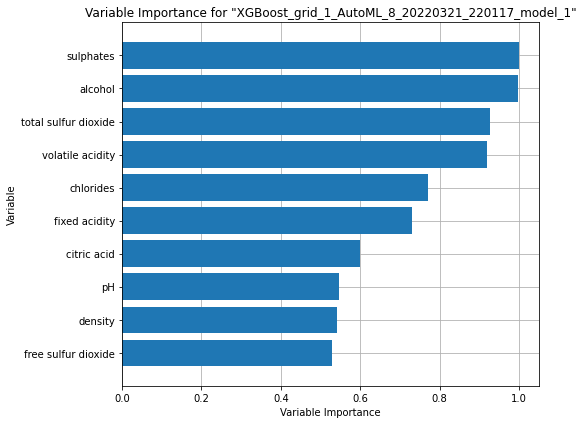

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

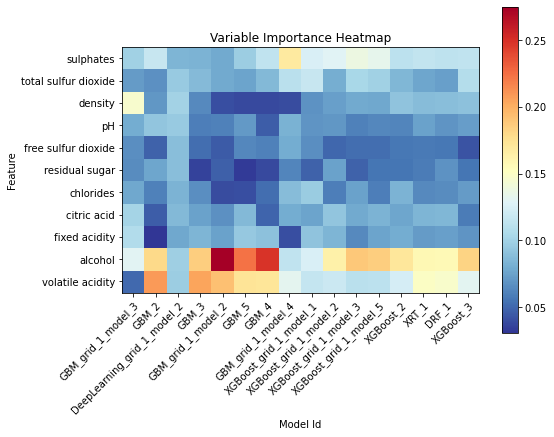

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

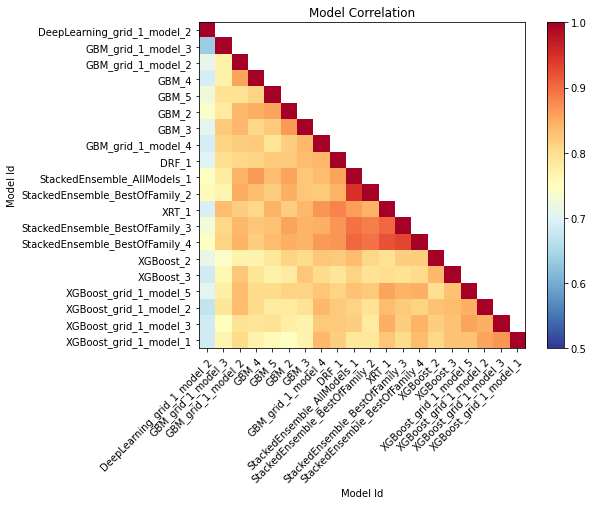

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

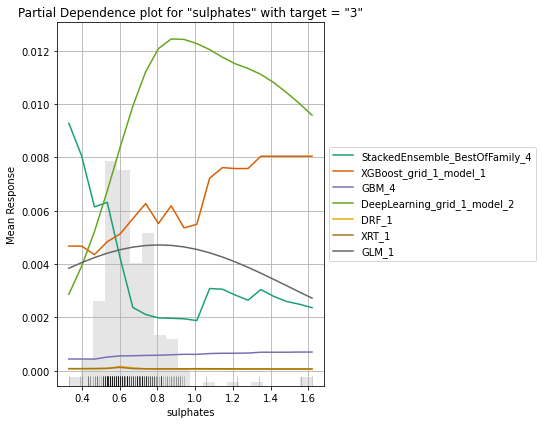

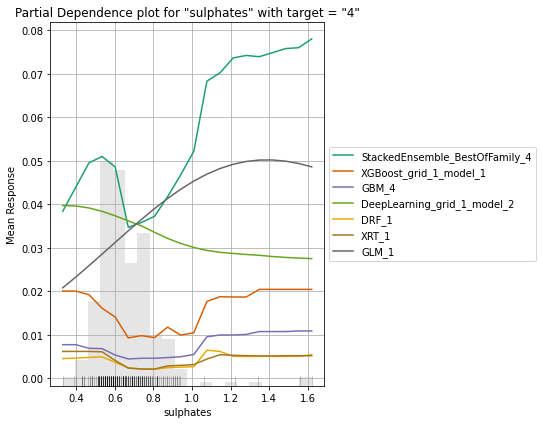

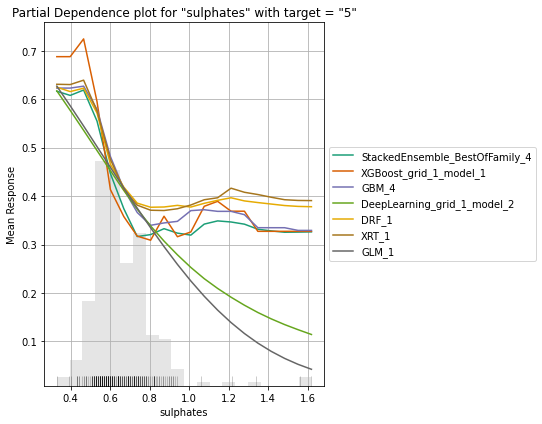

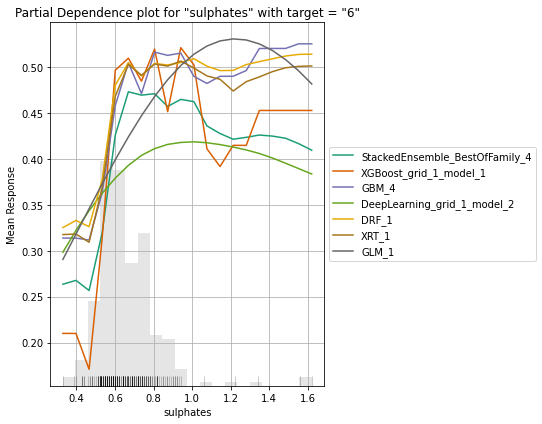

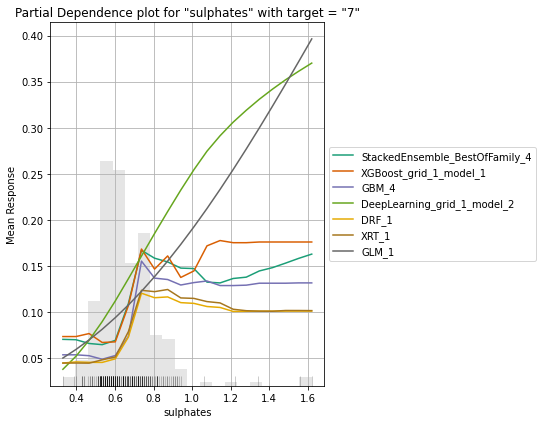

...

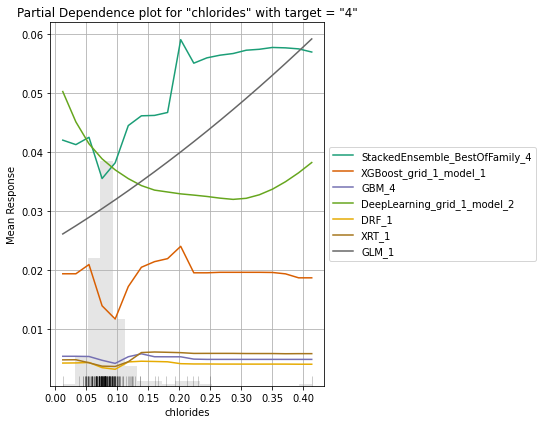

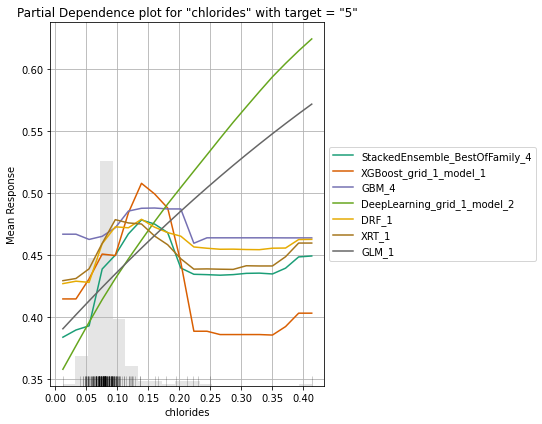

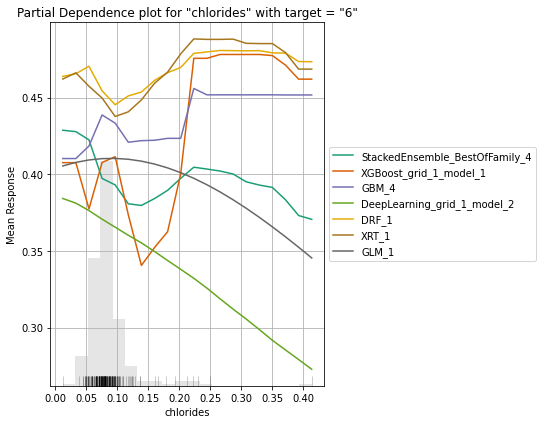

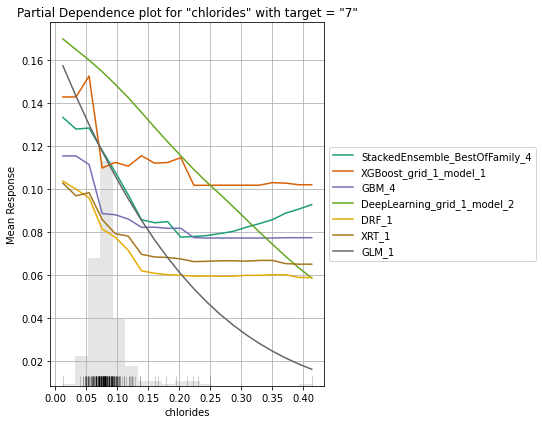

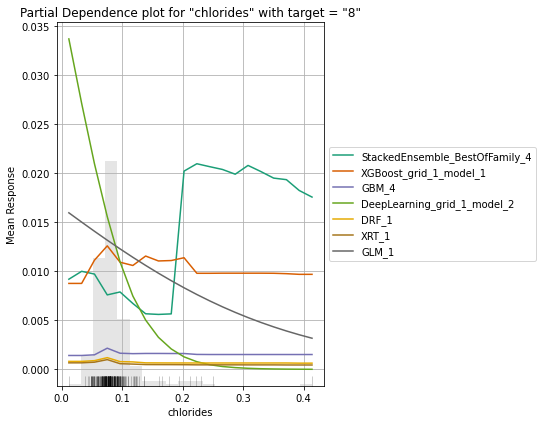

In [66]:
#to make the automl solve clf not regr
testing_frame = h2o.H2OFrame(pd.concat([X_test, y_test], axis=1))
testing_frame[target_col] = testing_frame[target_col].asfactor()

explain_model = aml.explain(frame = testing_frame, 
                            figsize = (8,6))

## tpot

In [12]:
!pip install tpot

     |████████████████████████████████| 87 kB 4.0 MB/s 
     |████████████████████████████████| 173.6 MB 8.1 kB/s 
     |████████████████████████████████| 160 kB 45.2 MB/s 
  Created wheel for stopit: filename=stopit-1.1.2-py3-none-any.whl size=11956 sha256=547f6c7cafbf540a9e9593f3764b3be162bb2abcdde977d1d09833d0c78e3389
  Stored in directory: /root/.cache/pip/wheels/e2/d2/79/eaf81edb391e27c87f51b8ef901ecc85a5363dc96b8b8d71e3
Successfully built stopit
  Attempting uninstall: xgboost
    Found existing installation: xgboost 0.90
    Uninstalling xgboost-0.90:
      Successfully uninstalled xgboost-0.90


In [13]:
from tpot import TPOTClassifier

In [67]:
tpot = TPOTClassifier(generations=5, population_size=50, verbosity=2, 
                      random_state=42,
                    #   config_dict='TPOT NN'
                      )
tpot.fit(X_train, y_train)
print(tpot.score(X_test, y_test))

# export the minimalized code for the best model found
tpot.export('tpot_wine_pipeline.py')

Optimization Progress:   0%|          | 0/300 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.6433795712484237

Generation 2 - Current best internal CV score: 0.6433795712484237

Generation 3 - Current best internal CV score: 0.6521107307992555

Generation 4 - Current best internal CV score: 0.6575752116735722

Generation 5 - Current best internal CV score: 0.6586681078484358

Best pipeline: ExtraTreesClassifier(input_matrix, bootstrap=False, criterion=gini, max_features=0.5, min_samples_leaf=2, min_samples_split=9, n_estimators=100)
0.6200873362445415


In [14]:
tpot = TPOTClassifier(generations=5, 
                      population_size=50, 
                      verbosity=2, 
                      random_state=42,
                      config_dict='TPOT NN'
                      )
tpot.fit(X_train, y_train)
print(tpot.score(X_test, y_test))

# export the minimalized code for the best model found
tpot.export('tpot_nn_wine_pipeline.py')

Optimization Progress:   0%|          | 0/300 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.6477331411757641

Generation 2 - Current best internal CV score: 0.6554254488680719

Generation 3 - Current best internal CV score: 0.6575932264456854

Generation 4 - Current best internal CV score: 0.6575932264456854

Generation 5 - Current best internal CV score: 0.6575932264456854

Best pipeline: ExtraTreesClassifier(ExtraTreesClassifier(input_matrix, bootstrap=False, criterion=entropy, max_features=0.7500000000000001, min_samples_leaf=3, min_samples_split=5, n_estimators=100), bootstrap=True, criterion=entropy, max_features=0.9000000000000001, min_samples_leaf=11, min_samples_split=19, n_estimators=100)
0.6375545851528385


In [18]:
tpot.evaluated_individuals_

{'BernoulliNB(ExtraTreesClassifier(DecisionTreeClassifier(input_matrix, DecisionTreeClassifier__criterion=gini, DecisionTreeClassifier__max_depth=2, DecisionTreeClassifier__min_samples_leaf=3, DecisionTreeClassifier__min_samples_split=6), ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.15000000000000002, ExtraTreesClassifier__min_samples_leaf=19, ExtraTreesClassifier__min_samples_split=10, ExtraTreesClassifier__n_estimators=100), BernoulliNB__alpha=100.0, BernoulliNB__fit_prior=True)': {'crossover_count': 0,
  'generation': 1,
  'internal_cv_score': 0.49344862787485744,
  'mutation_count': 1,
  'operator_count': 3,
  'predecessor': ('BernoulliNB(ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.15000000000000002, ExtraTreesClassifier__min_samples_leaf=19, ExtraTreesClassifier__min_samples_split=10, ExtraTreesClassifier__n_est

In [19]:
tpot.pareto_front_fitted_pipelines_

{'ExtraTreesClassifier(ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.7500000000000001, ExtraTreesClassifier__min_samples_leaf=3, ExtraTreesClassifier__min_samples_split=5, ExtraTreesClassifier__n_estimators=100), ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.9000000000000001, ExtraTreesClassifier__min_samples_leaf=11, ExtraTreesClassifier__min_samples_split=19, ExtraTreesClassifier__n_estimators=100)': Pipeline(steps=[('stackingestimator',
                  StackingEstimator(estimator=ExtraTreesClassifier(criterion='entropy',
                                                                   max_features=0.7500000000000001,
                                                                   min_samples_leaf=3,
                                                                   min_samples_split=5,
                 